# Worldpop Data Comparison 2020 vs 2025: Using Pop pyramid and AOI map selector

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://githubtocolab.com/worldbank/DECAT_Space2Stats/blob/main/docs/user-docs/space2stats_api_demo_pop_pyramid.ipynb)

In [ ]:
# !pip install geopandas ipyleaflet matplotlib

In [17]:
import requests
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import shape
import json
import ipywidgets as widgets
from ipyleaflet import Map, DrawControl

In [18]:
# BASE_URL = "https://space2stats.ds.io/"
BASE_URL = "http://127.0.0.1:8000"
FIELDS_ENDPOINT = f"{BASE_URL}/fields"
SUMMARY_ENDPOINT = f"{BASE_URL}/summary"

In [39]:
# Center the map in your region of interest
m = Map(center=(4.0, 33.0), zoom=6)

draw_control = DrawControl(
    polygon = {
        "shapeOptions": {
            "color": "#6e6d6b",
            "weight": 2,
            "fillOpacity": 0.5
        },
        "drawError": {
            "color": "#dd253b",
            "message": "Error drawing shape!"
        },
    },
    rectangle = {
        "shapeOptions": {
            "color": "#6e6d6b",
            "weight": 2,
            "fillOpacity": 0.5
        }
    },
    circlemarker={},
    polyline={},
    marker={}
)

user_aoi = None

def handle_draw(self, action, geo_json):
    global user_aoi
    user_aoi = geo_json
    print("AOI captured:")
    print(json.dumps(user_aoi, indent=2))
    
    # Convert to a shapely geometry
    geom = shape(geo_json['geometry'])
    print("Area (approx.):", geom.area, "square degrees")

draw_control.on_draw(handle_draw)
m.add_control(draw_control)

m

Map(center=[4.0, 33.0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_…

In [60]:
aoi_geojson = {
    "type": "Feature",
    "geometry": user_aoi['geometry'],
    "properties": {"name": "User Selected AOI"}
}

In [61]:
# Define which fields to request. Here we select both male and female at specific age intervals
age_groups = [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80]
female_fields_2020 = [f"sum_pop_f_{a}_2020" for a in age_groups]
male_fields_2020 = [f"sum_pop_m_{a}_2020" for a in age_groups]

age_groups2 = ["00", "05", 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80]
female_fields_2025 = [f"sum_f_{a}_2025" for a in age_groups2]
male_fields_2025 = [f"sum_m_{a}_2025" for a in age_groups2]

In [62]:
# Add total population fields if desired
fields_2020 = ["sum_pop_2020", "sum_pop_f_2020", "sum_pop_m_2020"] + female_fields_2020 + male_fields_2020
fields_2025 = ["sum_pop_2025", "sum_pop_2020_2", "sum_pop_2015", "sum_pop_2016",
    "sum_pop_2017",
    "sum_pop_2018",
    "sum_pop_2019",
    "sum_pop_2020",
    "sum_pop_2021",
    "sum_pop_2022",
    "sum_pop_2023",
    "sum_pop_2024",
    "sum_pop_2025", ] + female_fields_2025 + male_fields_2025

request_payload_2020 = {
    "aoi": aoi_geojson,
    "spatial_join_method": "touches",
    "fields": fields_2020,
    "geometry": "polygon",
}

request_payload_2025 = {
    "aoi": aoi_geojson,
    "spatial_join_method": "touches",
    "fields": fields_2025,
    "geometry": "polygon",
}

In [63]:
# Make the POST request
response_2020 = requests.post(SUMMARY_ENDPOINT, json=request_payload_2020, verify=False)
if response_2020.status_code != 200:
    raise Exception(f"Failed to get summary: {response_2020.status_code} {response_2020.text}. Try selecting a smaller AOI or requesting less fields")
summary_data_2020 = response_2020.json()

response_2025 = requests.post(SUMMARY_ENDPOINT, json=request_payload_2025, verify=False)
if response_2025.status_code != 200:
    raise Exception(f"Failed to get summary: {response_2025.status_code} {response_2025.text}. Try selecting a smaller AOI or requesting less fields")
summary_data_2025 = response_2025.json()

# Convert to DataFrame
df_2020 = pd.DataFrame(summary_data_2020)
df_2025 = pd.DataFrame(summary_data_2025)

In [64]:
import folium
from folium.plugins import DualMap
import numpy as np
# 
# Build GeoDataFrame as before
df_2020["geometry"] = df_2020["geometry"].apply(
    lambda geom: shape(json.loads(geom)) if isinstance(geom, str) else shape(geom)
)
gdf_2020 = gpd.GeoDataFrame(df_2020, geometry="geometry", crs="EPSG:4326")

# turn negatives into NaN for plotting
gdf_2020["sum_pop_2020_plot"] = gdf_2020["sum_pop_2020"].where(
    gdf_2020["sum_pop_2020"] >= 0, np.nan
)

# Build GeoDataFrame as before
df_2025["geometry"] = df_2025["geometry"].apply(
    lambda geom: shape(json.loads(geom)) if isinstance(geom, str) else shape(geom)
)
gdf_2025 = gpd.GeoDataFrame(df_2025, geometry="geometry", crs="EPSG:4326")

# Dual map container (left = m1, right = m2)
dual = DualMap(
    location=[0, 0],  # center the views; adjust for your AOI
    zoom_start=4,
    tiles="cartodbpositron",
     zoom_control=False, 
)

# Left pane → 2020
gdf_2020.explore(
    column="sum_pop_2020_plot",
    tooltip=["hex_id", "sum_pop_2020"],
    cmap="YlGnBu",
    legend=True,
    scheme="naturalbreaks",
    legend_kwds=dict(colorbar=True, caption="Source 2020, sum_pop_2020", interval=False),
    style_kwds=dict(weight=0, fillOpacity=0.8),
    missing_kwds=dict(color="#ffffff"),
    name="Population 2020",
    m=dual.m1,
)

# Right pane → e.g., 2025 totals (or any other field)
gdf_2025.explore(
    column="sum_pop_2020_2",
    tooltip=["hex_id", "sum_pop_2020_2"],
    cmap="OrRd",
    legend=True,
    scheme="naturalbreaks",
    legend_kwds=dict(colorbar=True, caption="Source 2025, sum_pop_2020_2", interval=False),
    style_kwds=dict(weight=0, fillOpacity=0.8),
    missing_kwds=dict(color="#fff", label="No data"),

    name="Population 2025",
    m=dual.m2,
)

# Auto-zoom both panes to the AOI extent
bounds = np.array(gdf_2020.total_bounds).reshape(2, 2)  # [[west, south], [east, north]]
# Folium expects [[south, west], [north, east]]
dual.m1.fit_bounds([[bounds[0][1], bounds[0][0]], [bounds[1][1], bounds[1][0]]])
dual.m2.fit_bounds([[bounds[0][1], bounds[0][0]], [bounds[1][1], bounds[1][0]]])

dual


# Side by Side Pyramid Graph

In [57]:
agg_fields_2020 = female_fields_2020 + male_fields_2020
agg_fields_2025 = female_fields_2025 + male_fields_2025

pyramid_data_2020 = df_2020[agg_fields_2020].sum()
pyramid_data_2025 = df_2025[agg_fields_2025].sum()

def totals_from_fields(field_list, summed_series):
    """Return values in field_list order to keep age bins aligned."""
    return [summed_series[field] for field in field_list]

male_vals_2020 = totals_from_fields(male_fields_2020, pyramid_data_2020)
female_vals_2020 = totals_from_fields(female_fields_2020, pyramid_data_2020)

male_vals_2025 = totals_from_fields(male_fields_2025, pyramid_data_2025)
female_vals_2025 = totals_from_fields(female_fields_2025, pyramid_data_2025)

age_labels_2020 = [f"{a}-{a+4}" if a < 80 else "80+" for a in age_groups]
age_labels_2025 = [f"{a}-{a+4}" if isinstance(a, int) and a < 80 else "80+" for a in age_groups]  # reuse same labels

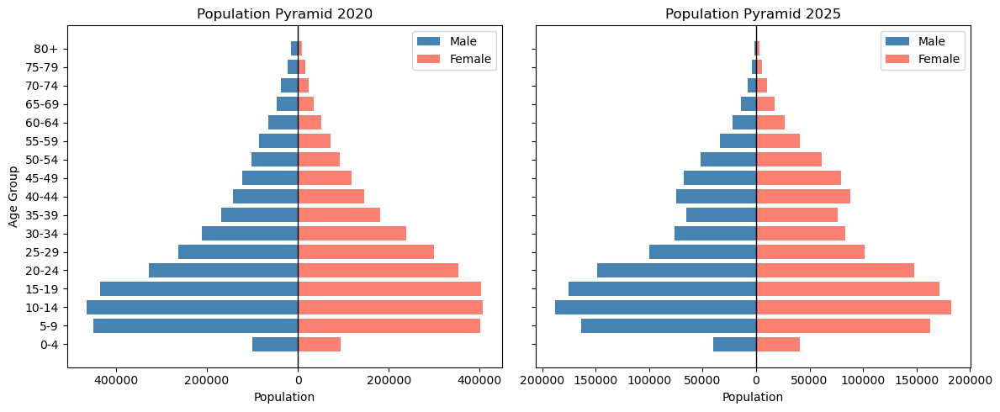

In [58]:
import numpy as np
from matplotlib.ticker import ScalarFormatter, FuncFormatter

def abs_formatter(x, pos):
    # show absolute value of tick (no minus sign)
    return f"{int(abs(x))}"

fig, axes = plt.subplots(ncols=2, sharey=True, figsize=(12, 5))

panes = [
    ("Population Pyramid 2020", age_labels_2020, male_vals_2020, female_vals_2020),
    ("Population Pyramid 2025", age_labels_2020, male_vals_2025, female_vals_2025),
]

for ax, (title, labels, male_vals, female_vals) in zip(axes, panes):
    ax.barh(labels, -np.array(male_vals), color="steelblue", label="Male")
    ax.barh(labels, female_vals, color="salmon", label="Female")
    ax.set_title(title)
    ax.set_xlabel("Population")
    ax.axvline(0, color="black", linewidth=1)
    ax.legend()

    # turn off scientific notation on x-axis
    ax.xaxis.set_major_formatter(ScalarFormatter(useMathText=False))
    ax.ticklabel_format(style="plain", axis="x")
    # turn off scientific notation on x-axis
    ax.xaxis.set_major_formatter(FuncFormatter(abs_formatter))

axes[0].set_ylabel("Age Group")
plt.tight_layout()
plt.show()